In [1]:
from pathlib import Path
import random
from PIL import Image
import io
import matplotlib.pyplot as plt
import numpy as np

# **Load data**

In [2]:
test_data_folder = Path("../src/Dataset/test_data")

In [3]:
def load_data(folder) -> list:
    data_rgb = []

    for file in folder.glob("*.png"):
        image = Image.open(file).convert("RGB")
        data_rgb.append(image.copy())
        image.close()

    print("Count of loaded .png images:", len(data_rgb))
    return data_rgb

loaded_data_rgb = load_data(test_data_folder)

Count of loaded .png images: 71


### **Example of using on all images**

In [4]:
results = []

codec = JPEGCodec1(block_size=8, color_space="YCbCr")

for idx, img in enumerate(loaded_data_rgb):
    encoded = codec.encode(img)
    decoded = codec.decode(encoded)

    results.append({
        "index": idx,
        "original": img,
        "encoded": encoded,
        "decoded": decoded
    })

NameError: name 'JPEGCodec1' is not defined

### **Plot**

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def psnr(img1, img2):
    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float("inf")
    return 10 * np.log10((255 ** 2) / mse)

def reconstruction_stats(original, reconstructed):
    original = original.astype(np.float64)
    reconstructed = reconstructed.astype(np.float64)

    diff = original - reconstructed
    abs_diff = np.abs(diff)
    mse = np.mean(diff ** 2)
    mae = np.mean(abs_diff)
    max_err = np.max(abs_diff)
    psnr_val = psnr(original, reconstructed)

    return {
        "MSE": mse,
        "MAE": mae,
        "Max absolute error": max_err,
        "PSNR": psnr_val
    }
def visualize_codec_step(img, transformed, reconstructed, codec, color_space="YCbCr"):
    original_np = np.asarray(img.convert("RGB"))
    reconstructed_np = np.asarray(reconstructed)

    stats = reconstruction_stats(original_np, reconstructed_np)

    diff = np.abs(original_np.astype(np.float64) - reconstructed_np.astype(np.float64))
    diff_vis = np.clip(diff * 8, 0, 255).astype(np.uint8)

    coeff1 = codec._merge_blocks(transformed["ch1"])
    coeff2 = codec._merge_blocks(transformed["ch2"])
    coeff3 = codec._merge_blocks(transformed["ch3"])

    coeffs_vis = [
        np.log1p(np.abs(coeff1)),
        np.log1p(np.abs(coeff2)),
        np.log1p(np.abs(coeff3)),
    ]

    if color_space == "YCbCr":
        channel_names = ["Y", "Cb", "Cr"]
    else:
        channel_names = ["R", "G", "B"]

    fig, axes = plt.subplots(2, 3, figsize=(16, 11))

    axes[0, 0].imshow(original_np)
    axes[0, 0].set_title("Original", fontsize=18)
    axes[0, 0].axis("off")

    axes[0, 1].imshow(reconstructed_np)
    axes[0, 1].set_title("Reconstructed", fontsize=18)
    axes[0, 1].axis("off")

    axes[0, 2].imshow(np.log1p(diff_vis.astype(np.float64)), cmap="hot")
    axes[0, 2].set_title("Log absolute difference", fontsize=18)
    axes[0, 2].axis("off")

    cmaps = ["gray", "Blues", "Reds"]
    for idx in range(3):
        axes[1, idx].imshow(coeffs_vis[idx], cmap=cmaps[idx], aspect="auto")
        axes[1, idx].set_title(f"DCT coefficients ({channel_names[idx]})", fontsize=18)
        axes[1, idx].axis("off")

    plt.tight_layout()
    plt.show()

    print("Reconstruction statistics")
    for key, value in stats.items():
        if isinstance(value, float):
            print(f"{key}: {value:.6f}")
        else:
            print(f"{key}: {value}")


def visualize_quantization_step(img, quantized, decoded, codec, color_space="YCbCr"):
    original_np = np.asarray(img.convert("RGB"))
    decoded_np = np.asarray(decoded)

    diff = np.abs(original_np.astype(np.float64) - decoded_np.astype(np.float64))
    diff_vis = np.log1p(diff)

    q1 = codec._merge_blocks(quantized["ch1"])
    q2 = codec._merge_blocks(quantized["ch2"])
    q3 = codec._merge_blocks(quantized["ch3"])

    q_vis = [
        np.log1p(np.abs(q1)),
        np.log1p(np.abs(q2)),
        np.log1p(np.abs(q3)),
    ]

    if color_space == "YCbCr":
        channel_names = ["Y", "Cb", "Cr"]
        cmaps = ["gray", "Blues", "Reds"]
    else:
        channel_names = ["R", "G", "B"]
        cmaps = ["Reds", "Greens", "Blues"]

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    axes[0, 0].imshow(original_np)
    axes[0, 0].set_title("Original")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(decoded_np)
    axes[0, 1].set_title("Decoded after quantization")
    axes[0, 1].axis("off")

    axes[0, 2].imshow(diff_vis)
    axes[0, 2].set_title("Log-scaled absolute error")
    axes[0, 2].axis("off")

    for i in range(3):
        axes[1, i].imshow(q_vis[i], cmap=cmaps[i])
        axes[1, i].set_title(f"Quantized coefficients ({channel_names[i]})")
        axes[1, i].axis("off")

    plt.tight_layout()
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..3.8918202981106265].


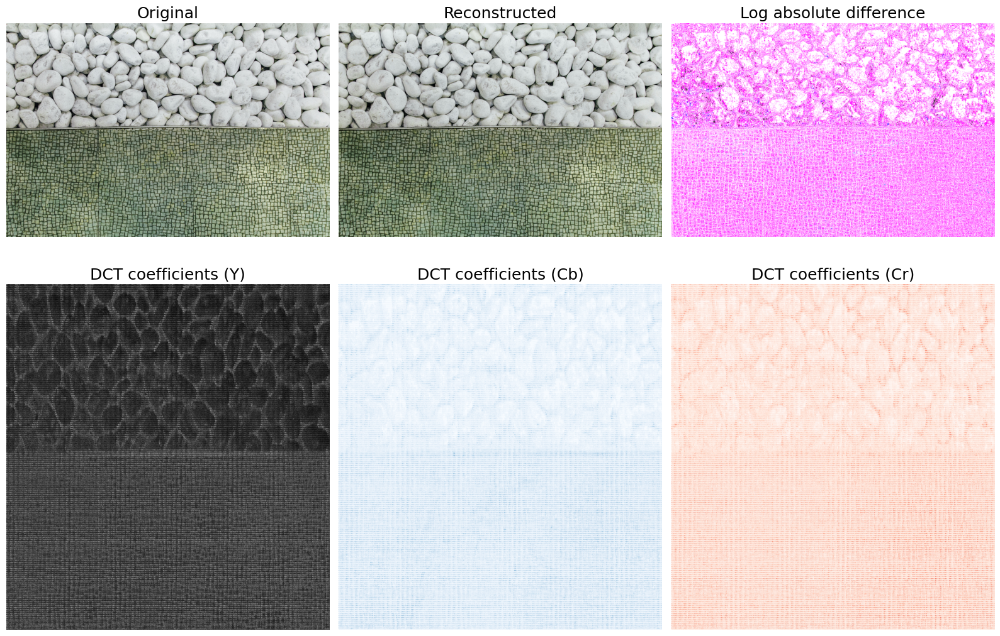

Reconstruction statistics
MSE: 3.706782
MAE: 1.630696
Max absolute error: 6.000000
PSNR: 42.440833


In [5]:
from transform import *

codec = JPEGCodec1(block_size=8, color_space="YCbCr")

img = loaded_data_rgb[0]

transformed = codec.transform(img)
reconstructed = codec.inverse_transform(transformed)

visualize_codec_step(img, transformed, reconstructed, codec, color_space="YCbCr")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.545177444479562].


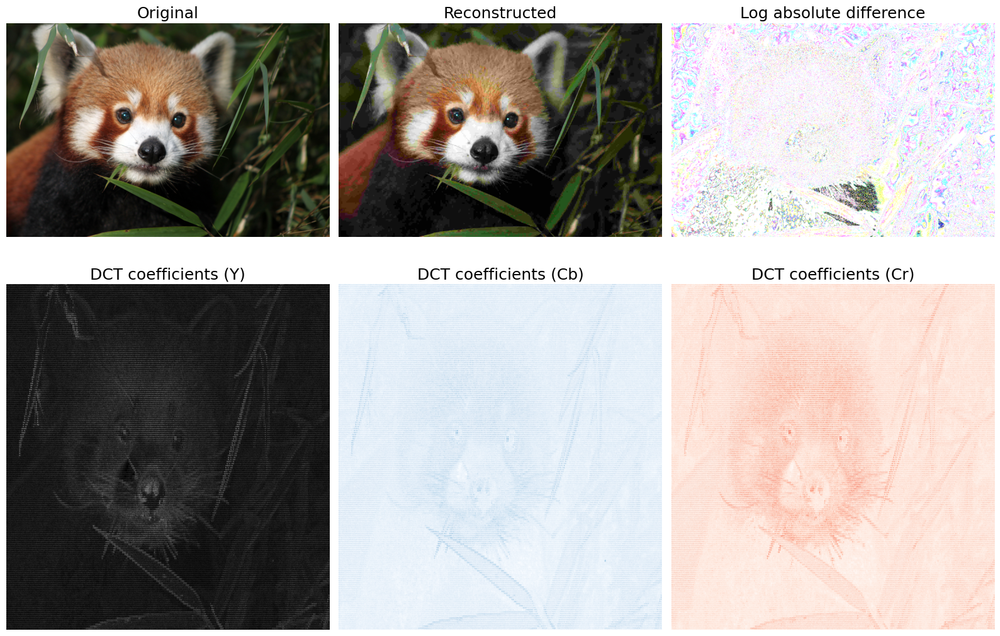

Reconstruction statistics
MSE: 97.233251
MAE: 7.509910
Max absolute error: 116.000000
PSNR: 28.252656


In [6]:
from quantization import *

codec = JPEGCodec2(block_size=8, color_space="YCbCr", q_y=100, q_c=160)

img = loaded_data_rgb[10]

transformed = codec.transform(img)
quantized = codec.quantize(transformed)
dequantized = codec.dequantize(quantized)
reconstructed = codec.inverse_transform(dequantized)

visualize_codec_step(img, transformed, reconstructed, codec, color_space="YCbCr")

In [7]:
def visualize_entropy_step(img, encoded_symbols, decoded_entropy, codec, color_space="YCbCr"):
    original_np = np.asarray(img.convert("RGB"))
    decoded_np = np.asarray(decoded_entropy.convert("RGB"))

    stats = reconstruction_stats(original_np, decoded_np)
    rate_info = codec.estimate_rate(encoded_symbols)

    diff = np.abs(original_np.astype(np.float64) - decoded_np.astype(np.float64))
    diff_vis = np.log1p(diff)

    # Reconstruct quantized DCT blocks from entropy symbols
    q_ch1 = codec.entropy_reconstruct_channel(encoded_symbols["ch1"])
    q_ch2 = codec.entropy_reconstruct_channel(encoded_symbols["ch2"])
    q_ch3 = codec.entropy_reconstruct_channel(encoded_symbols["ch3"])

    q1 = codec._merge_blocks(q_ch1)
    q2 = codec._merge_blocks(q_ch2)
    q3 = codec._merge_blocks(q_ch3)

    q_vis = [
        np.log1p(np.abs(q1)),
        np.log1p(np.abs(q2)),
        np.log1p(np.abs(q3)),
    ]

    if color_space == "YCbCr":
        channel_names = ["Y", "Cb", "Cr"]
        cmaps = ["gray", "Blues", "Reds"]
    else:
        channel_names = ["R", "G", "B"]
        cmaps = ["Reds", "Greens", "Blues"]

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    axes[0, 0].imshow(original_np)
    axes[0, 0].set_title("Original")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(decoded_np)
    axes[0, 1].set_title("Decoded after entropy symbols")
    axes[0, 1].axis("off")

    axes[0, 2].imshow(diff_vis)
    axes[0, 2].set_title("Log-scaled absolute error")
    axes[0, 2].axis("off")

    for i in range(3):
        axes[1, i].imshow(q_vis[i], cmap=cmaps[i])
        axes[1, i].set_title(f"Recovered quantized coeffs ({channel_names[i]})")
        axes[1, i].axis("off")

    plt.tight_layout()
    plt.show()

    print("Reconstruction statistics after entropy-symbol decoding")
    for key, value in stats.items():
        print(f"{key}: {value:.6f}")

    print("\nEstimated entropy/rate information")
    for key, value in rate_info.items():
        print(f"{key}: {value:.6f}" if isinstance(value, float) else f"{key}: {value}")

{'entropy_bits_per_symbol': 4.155724486177171, 'num_symbols': 541749, 'estimated_bits': 2251359.584661996, 'estimated_bpp': 0.8243694579664343}
PSNR: 29.651781162642912


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4.672828834461906].


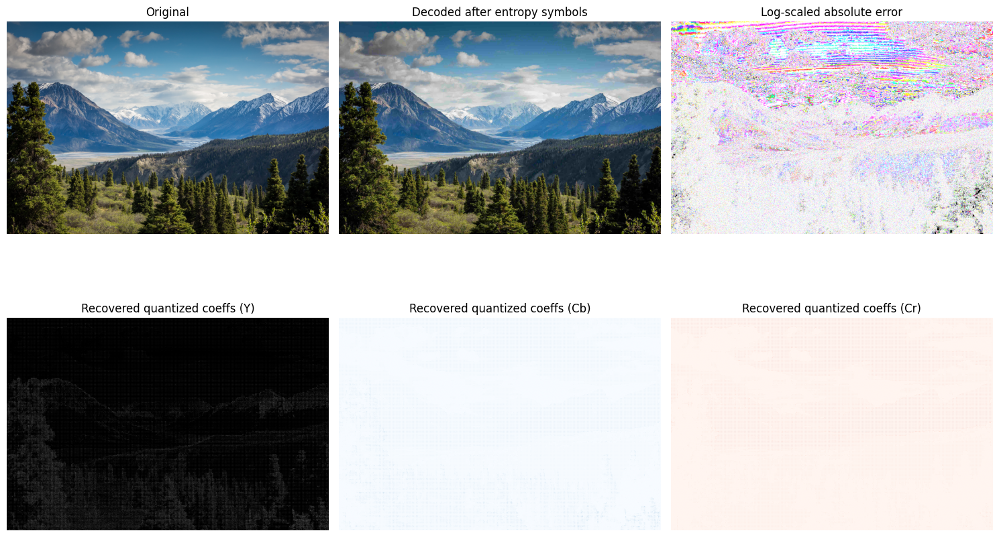

Reconstruction statistics after entropy-symbol decoding
MSE: 70.453447
MAE: 5.950618
Max absolute error: 106.000000
PSNR: 29.651781

Estimated entropy/rate information
entropy_bits_per_symbol: 4.155724
num_symbols: 541749
estimated_bits: 2251359.584662
estimated_bpp: 0.824369


In [8]:
from entropy import *

img = loaded_data_rgb[20]

codec = JPEGCodec3(
    block_size=8,
    color_space="YCbCr",
    q_y=40,
    q_c=40*1.6,
)

encoded = codec.encode_symbols(img)
decoded = codec.decode_symbols(encoded)

rate_info = codec.estimate_rate(encoded)
psnr_value = codec.psnr(img, decoded)

print(rate_info)
print("PSNR:", psnr_value)


visualize_entropy_step(
    img=img,
    encoded_symbols=encoded,
    decoded_entropy=decoded,
    codec=codec,
    color_space=codec.color_space
)

In [9]:
def compression_report(img, encoded_symbols, codec):
    rate = codec.estimate_rate(encoded_symbols)

    width, height = img.size
    raw_bpp = 24.0
    raw_bits = width * height * raw_bpp

    estimated_bits = rate["estimated_bits"]
    estimated_bpp = rate["estimated_bpp"]

    compression_ratio = raw_bits / estimated_bits

    return {
        "raw_bpp": raw_bpp,
        "estimated_bpp": estimated_bpp,
        "raw_bits": raw_bits,
        "estimated_bits": estimated_bits,
        "compression_ratio": compression_ratio,
        "entropy_bits_per_symbol": rate["entropy_bits_per_symbol"],
        "num_symbols": rate["num_symbols"],
    }

encoded_symbols = codec.encode_symbols(img)
decoded = codec.decode_symbols(encoded_symbols)

report = compression_report(img, encoded_symbols, codec)

for k, v in report.items():
    print(f"{k}: {v}")

raw_bpp: 24.0
estimated_bpp: 0.8243694579664343
raw_bits: 65544192.0
estimated_bits: 2251359.584661996
compression_ratio: 29.11316008625977
entropy_bits_per_symbol: 4.155724486177171
num_symbols: 541749


In [10]:
q_values = [10, 20, 30, 40, 50, 100, 200, 300, 400, 500]

results = []

for q in q_values:
    codec = JPEGCodec3(
        block_size=8,
        color_space="YCbCr",
        q_y=q,
        q_c=1.6 * q
    )

    encoded = codec.encode_symbols(img)
    decoded = codec.decode_symbols(encoded)

    original_np = np.asarray(img.convert("RGB"))
    decoded_np = np.asarray(decoded.convert("RGB"))

    stats = reconstruction_stats(original_np, decoded_np)
    comp = compression_report(img, encoded, codec)

    results.append({
        "q_y": q,
        "q_c": 1.6 * q,
        "bpp": comp["estimated_bpp"],
        "compression_ratio": comp["compression_ratio"],
        "PSNR": stats["PSNR"],
        "MSE": stats["MSE"],
    })

    print(
        f"q_y={q:>4}, "
        f"bpp={comp['estimated_bpp']:.4f}, "
        f"CR={comp['compression_ratio']:.2f}:1, "
        f"PSNR={stats['PSNR']:.2f} dB, "
        f"MSE={stats['MSE']:.2f}"
    )

q_y=  10, bpp=2.2256, CR=10.78:1, PSNR=36.38 dB, MSE=14.97
q_y=  20, bpp=1.4076, CR=17.05:1, PSNR=33.25 dB, MSE=30.77
q_y=  30, bpp=1.0425, CR=23.02:1, PSNR=31.15 dB, MSE=49.95
q_y=  40, bpp=0.8244, CR=29.11:1, PSNR=29.65 dB, MSE=70.45
q_y=  50, bpp=0.6771, CR=35.45:1, PSNR=28.49 dB, MSE=92.10
q_y= 100, bpp=0.3413, CR=70.33:1, PSNR=24.92 dB, MSE=209.59
q_y= 200, bpp=0.1787, CR=134.30:1, PSNR=21.72 dB, MSE=437.65
q_y= 300, bpp=0.1362, CR=176.25:1, PSNR=18.94 dB, MSE=829.11
q_y= 400, bpp=0.1185, CR=202.50:1, PSNR=18.08 dB, MSE=1011.57
q_y= 500, bpp=0.1119, CR=214.45:1, PSNR=17.56 dB, MSE=1141.62


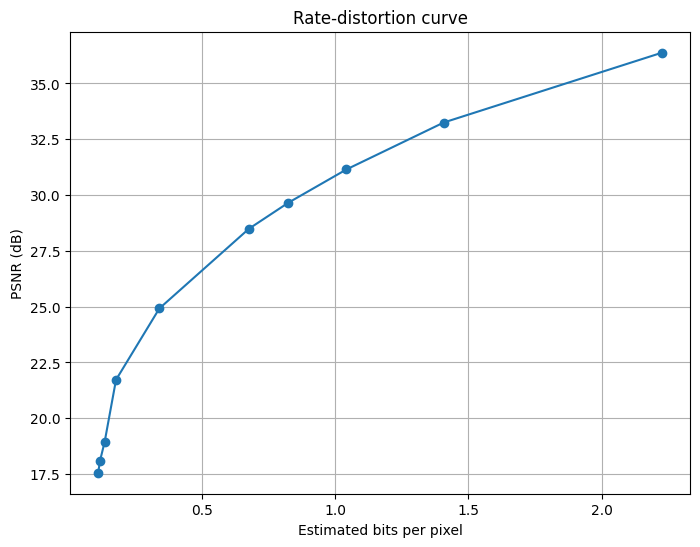

In [11]:
bpp = [r["bpp"] for r in results]
psnr_values = [r["PSNR"] for r in results]

plt.figure(figsize=(8, 6))
plt.plot(bpp, psnr_values, marker="o")
plt.xlabel("Estimated bits per pixel")
plt.ylabel("PSNR (dB)")
plt.title("Rate-distortion curve")
plt.grid(True)
plt.show()

In [9]:
import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
from skimage.metrics import structural_similarity as ssim


# ============================================================
# Image conversion helpers
# ============================================================

def image_to_numpy(img):
    """
    Converts PIL / torch tensor / numpy array to numpy image [H, W, C] or [H, W]
    with float values in [0, 1].
    """

    if isinstance(img, Image.Image):
        arr = np.asarray(img).astype(np.float32)
        if arr.max() > 1.0:
            arr /= 255.0
        return np.clip(arr, 0.0, 1.0)

    if isinstance(img, torch.Tensor):
        img = img.detach().cpu()

        # Remove batch dimension: [1, C, H, W] -> [C, H, W]
        if img.ndim == 4:
            img = img[0]

        # [C, H, W] -> [H, W, C]
        if img.ndim == 3 and img.shape[0] in [1, 3]:
            img = img.permute(1, 2, 0)

        arr = img.numpy().astype(np.float32)

        if arr.ndim == 3 and arr.shape[-1] == 1:
            arr = arr[..., 0]

        if arr.max() > 1.0:
            arr /= 255.0

        return np.clip(arr, 0.0, 1.0)

    if isinstance(img, np.ndarray):
        arr = img.astype(np.float32)

        # [C, H, W] -> [H, W, C]
        if arr.ndim == 3 and arr.shape[0] in [1, 3]:
            arr = np.transpose(arr, (1, 2, 0))

        if arr.ndim == 3 and arr.shape[-1] == 1:
            arr = arr[..., 0]

        if arr.max() > 1.0:
            arr /= 255.0

        return np.clip(arr, 0.0, 1.0)

    raise TypeError(f"Unsupported image type: {type(img)}")


def to_gray(img):
    """
    Converts RGB image to grayscale. Leaves grayscale unchanged.
    Input must be float image in [0, 1].
    """

    if img.ndim == 2:
        return img

    return (
        0.299 * img[..., 0]
        + 0.587 * img[..., 1]
        + 0.114 * img[..., 2]
    )


def crop_np(img, zoom):
    """
    zoom = (x0, y0, x1, y1)
    """

    if zoom is None:
        return img

    x0, y0, x1, y1 = zoom
    return img[y0:y1, x0:x1]


def draw_block_grid(ax, height, width, block_size=8, alpha=0.20, linewidth=0.35):
    """
    Draws JPEG 8x8 block grid.
    """

    for x in range(0, width, block_size):
        ax.axvline(x - 0.5, linewidth=linewidth, alpha=alpha)

    for y in range(0, height, block_size):
        ax.axhline(y - 0.5, linewidth=linewidth, alpha=alpha)


# ============================================================
# Metric helpers
# ============================================================

def mse_float(img1, img2):
    """
    MSE in pixel-value domain [0, 255].
    """

    img1_255 = img1.astype(np.float64) * 255.0
    img2_255 = img2.astype(np.float64) * 255.0

    return float(np.mean((img1_255 - img2_255) ** 2))


def mae_float(img1, img2):
    """
    MAE in pixel-value domain [0, 255].
    """

    img1_255 = img1.astype(np.float64) * 255.0
    img2_255 = img2.astype(np.float64) * 255.0

    return float(np.mean(np.abs(img1_255 - img2_255)))


def psnr_float(img1, img2, max_val=255.0):
    mse = mse_float(img1, img2)

    if mse == 0:
        return float("inf")

    return float(10.0 * np.log10((max_val ** 2) / mse))


def ssim_float(img1, img2):
    """
    SSIM using [0, 1] images.
    """

    if img1.ndim == 2:
        return float(ssim(img1, img2, data_range=1.0))

    return float(
        ssim(
            img1,
            img2,
            data_range=1.0,
            channel_axis=2
        )
    )


def compute_basic_metrics(original, reconstruction):
    return {
        "mse": mse_float(original, reconstruction),
        "mae": mae_float(original, reconstruction),
        "psnr": psnr_float(original, reconstruction),
        "ssim": ssim_float(original, reconstruction),
    }


def compute_block_boundary_score(img, block_size=8):
    """
    Measures average absolute jump across JPEG block boundaries.

    Larger value means stronger block-boundary discontinuities.
    Computed on grayscale image in [0, 1], reported in [0, 255].
    """

    gray = to_gray(img)

    h, w = gray.shape

    vertical_jumps = []
    horizontal_jumps = []

    for x in range(block_size, w, block_size):
        jump = np.abs(gray[:, x] - gray[:, x - 1])
        vertical_jumps.append(jump)

    for y in range(block_size, h, block_size):
        jump = np.abs(gray[y, :] - gray[y - 1, :])
        horizontal_jumps.append(jump)

    values = []

    if len(vertical_jumps) > 0:
        values.append(np.concatenate(vertical_jumps))

    if len(horizontal_jumps) > 0:
        values.append(np.concatenate(horizontal_jumps))

    if len(values) == 0:
        return 0.0

    values = np.concatenate(values)

    return float(np.mean(values) * 255.0)


def compute_non_boundary_gradient_score(img, block_size=8):
    """
    Average absolute adjacent-pixel difference away from block boundaries.
    This is useful for comparing block-edge jumps to normal local gradients.
    """

    gray = to_gray(img)

    h, w = gray.shape

    dx = np.abs(gray[:, 1:] - gray[:, :-1])
    dy = np.abs(gray[1:, :] - gray[:-1, :])

    x_positions = np.arange(1, w)
    y_positions = np.arange(1, h)

    non_boundary_x = (x_positions % block_size) != 0
    non_boundary_y = (y_positions % block_size) != 0

    dx_non = dx[:, non_boundary_x]
    dy_non = dy[non_boundary_y, :]

    return float(np.mean(np.concatenate([dx_non.ravel(), dy_non.ravel()])) * 255.0)


def compute_artifact_scores(img, block_size=8):
    boundary = compute_block_boundary_score(img, block_size=block_size)
    non_boundary = compute_non_boundary_gradient_score(img, block_size=block_size)

    ratio = boundary / (non_boundary + 1e-8)

    return {
        "block_boundary_jump": boundary,
        "non_boundary_gradient": non_boundary,
        "boundary_to_non_boundary_ratio": float(ratio),
    }


# ============================================================
# Main evaluation function
# ============================================================

def evaluate_image_triplet(
    original,
    decoded,
    enhanced,
    output_dir="outputs/evaluation_single_image",
    name="example",
    zoom=None,
    block_size=8,
    show_grid=True,
    save_figures=True,
    show_figures=True
):
    """
    Evaluates and plots original, decoded, and enhanced images.

    Parameters
    ----------
    original, decoded, enhanced:
        Can be PIL images, numpy arrays, or torch tensors.

    output_dir:
        Folder where plots and text report are saved.

    name:
        Prefix for saved files.

    zoom:
        None or tuple (x0, y0, x1, y1).
        If given, plots a zoomed crop.

    block_size:
        JPEG block size, usually 8.

    show_grid:
        If True, overlays an 8x8 grid on visual plots.

    save_figures:
        If True, saves plots to output_dir.

    show_figures:
        If True, displays plots with plt.show().

    Returns
    -------
    results:
        Dictionary containing metrics and artifact scores.
    """

    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)

    # -----------------------------
    # Convert images
    # -----------------------------

    original_np = image_to_numpy(original)
    decoded_np = image_to_numpy(decoded)
    enhanced_np = image_to_numpy(enhanced)

    if original_np.shape != decoded_np.shape:
        raise ValueError(
            f"Shape mismatch: original={original_np.shape}, decoded={decoded_np.shape}"
        )

    if original_np.shape != enhanced_np.shape:
        raise ValueError(
            f"Shape mismatch: original={original_np.shape}, enhanced={enhanced_np.shape}"
        )

    h, w = to_gray(original_np).shape

    # -----------------------------
    # Metrics
    # -----------------------------

    decoded_metrics = compute_basic_metrics(original_np, decoded_np)
    enhanced_metrics = compute_basic_metrics(original_np, enhanced_np)

    decoded_artifacts = compute_artifact_scores(decoded_np, block_size=block_size)
    enhanced_artifacts = compute_artifact_scores(enhanced_np, block_size=block_size)

    mse_reduction = (
        100.0
        * (decoded_metrics["mse"] - enhanced_metrics["mse"])
        / (decoded_metrics["mse"] + 1e-8)
    )

    mae_reduction = (
        100.0
        * (decoded_metrics["mae"] - enhanced_metrics["mae"])
        / (decoded_metrics["mae"] + 1e-8)
    )

    boundary_reduction = (
        100.0
        * (
            decoded_artifacts["block_boundary_jump"]
            - enhanced_artifacts["block_boundary_jump"]
        )
        / (decoded_artifacts["block_boundary_jump"] + 1e-8)
    )

    results = {
        "image_shape": original_np.shape,

        "decoded": {
            **decoded_metrics,
            **decoded_artifacts,
        },

        "enhanced": {
            **enhanced_metrics,
            **enhanced_artifacts,
        },

        "improvement": {
            "mse_reduction_percent": float(mse_reduction),
            "mae_reduction_percent": float(mae_reduction),
            "psnr_gain_db": float(enhanced_metrics["psnr"] - decoded_metrics["psnr"]),
            "ssim_gain": float(enhanced_metrics["ssim"] - decoded_metrics["ssim"]),
            "block_boundary_jump_reduction_percent": float(boundary_reduction),
        }
    }

    # -----------------------------
    # Print report
    # -----------------------------

    report = f"""
Image evaluation: {name}
{'=' * (18 + len(name))}

Image shape:
    {original_np.shape}

Reconstruction metrics against original
---------------------------------------
Decoded:
    MSE:   {decoded_metrics['mse']:.4f}
    MAE:   {decoded_metrics['mae']:.4f}
    PSNR:  {decoded_metrics['psnr']:.4f} dB
    SSIM:  {decoded_metrics['ssim']:.4f}

Enhanced:
    MSE:   {enhanced_metrics['mse']:.4f}
    MAE:   {enhanced_metrics['mae']:.4f}
    PSNR:  {enhanced_metrics['psnr']:.4f} dB
    SSIM:  {enhanced_metrics['ssim']:.4f}

Improvement
-----------
    MSE reduction:   {mse_reduction:.2f} %
    MAE reduction:   {mae_reduction:.2f} %
    PSNR gain:       {enhanced_metrics['psnr'] - decoded_metrics['psnr']:.4f} dB
    SSIM gain:       {enhanced_metrics['ssim'] - decoded_metrics['ssim']:.4f}

8x8 block-boundary statistics
-----------------------------
Decoded:
    Boundary jump:                 {decoded_artifacts['block_boundary_jump']:.4f}
    Non-boundary gradient:          {decoded_artifacts['non_boundary_gradient']:.4f}
    Boundary / non-boundary ratio:  {decoded_artifacts['boundary_to_non_boundary_ratio']:.4f}

Enhanced:
    Boundary jump:                 {enhanced_artifacts['block_boundary_jump']:.4f}
    Non-boundary gradient:          {enhanced_artifacts['non_boundary_gradient']:.4f}
    Boundary / non-boundary ratio:  {enhanced_artifacts['boundary_to_non_boundary_ratio']:.4f}

Boundary jump reduction:
    {boundary_reduction:.2f} %
"""

    print(report)

    report_path = output_dir / f"{name}_evaluation_report.txt"
    with open(report_path, "w", encoding="utf-8") as f:
        f.write(report)

    # -----------------------------
    # Prepare images for plotting
    # -----------------------------

    original_plot = crop_np(original_np, zoom)
    decoded_plot = crop_np(decoded_np, zoom)
    enhanced_plot = crop_np(enhanced_np, zoom)

    original_gray = to_gray(original_plot)
    decoded_gray = to_gray(decoded_plot)
    enhanced_gray = to_gray(enhanced_plot)

    decoded_error = np.abs(original_gray - decoded_gray)
    enhanced_error = np.abs(original_gray - enhanced_gray)

    improvement_map = decoded_error - enhanced_error
    signed_change = enhanced_gray - decoded_gray
    abs_change = np.abs(signed_change)

    plot_h, plot_w = original_gray.shape

    # Common visualization ranges
    max_error = np.percentile(
        np.concatenate([decoded_error.ravel(), enhanced_error.ravel()]),
        99
    )
    max_error = max(max_error, 1e-6)

    max_signed_improvement = np.percentile(np.abs(improvement_map), 99)
    max_signed_improvement = max(max_signed_improvement, 1e-6)

    max_signed_change = np.percentile(np.abs(signed_change), 99)
    max_signed_change = max(max_signed_change, 1e-6)

    # -----------------------------
    # Figure 1: Main comparison
    # -----------------------------

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    images = [decoded_plot, enhanced_plot, original_plot]
    titles = [
        f"Decoded\nPSNR={decoded_metrics['psnr']:.2f} dB, SSIM={decoded_metrics['ssim']:.3f}",
        f"Enhanced\nPSNR={enhanced_metrics['psnr']:.2f} dB, SSIM={enhanced_metrics['ssim']:.3f}",
        "Original"
    ]

    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img, cmap="gray" if img.ndim == 2 else None)
        ax.set_title(title)
        ax.axis("off")

        if show_grid:
            draw_block_grid(ax, plot_h, plot_w, block_size=block_size)

    plt.tight_layout()

    if save_figures:
        fig.savefig(output_dir / f"{name}_comparison.png", dpi=300, bbox_inches="tight")

    if show_figures:
        plt.show()
    else:
        plt.close(fig)

    # -----------------------------
    # Figure 2: Error maps against original
    # -----------------------------

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    im0 = axes[0].imshow(decoded_error, cmap="magma", vmin=0, vmax=max_error)
    axes[0].set_title("Absolute error: |Original - Decoded|")
    axes[0].axis("off")
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

    im1 = axes[1].imshow(enhanced_error, cmap="magma", vmin=0, vmax=max_error)
    axes[1].set_title("Absolute error: |Original - Enhanced|")
    axes[1].axis("off")
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    im2 = axes[2].imshow(
        improvement_map,
        cmap="seismic",
        vmin=-max_signed_improvement,
        vmax=max_signed_improvement
    )
    axes[2].set_title("Error improvement\npositive = enhanced is better")
    axes[2].axis("off")
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    if show_grid:
        for ax in axes:
            draw_block_grid(ax, plot_h, plot_w, block_size=block_size)

    plt.tight_layout()

    if save_figures:
        fig.savefig(output_dir / f"{name}_error_maps.png", dpi=300, bbox_inches="tight")

    if show_figures:
        plt.show()
    else:
        plt.close(fig)

    # -----------------------------
    # Figure 3: What did the CNN change?
    # -----------------------------

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    im0 = axes[0].imshow(
        signed_change,
        cmap="seismic",
        vmin=-max_signed_change,
        vmax=max_signed_change
    )
    axes[0].set_title("Signed CNN change\nEnhanced - Decoded")
    axes[0].axis("off")
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

    im1 = axes[1].imshow(
        abs_change,
        cmap="magma",
        vmin=0,
        vmax=np.percentile(abs_change, 99)
    )
    axes[1].set_title("Absolute CNN change\n|Enhanced - Decoded|")
    axes[1].axis("off")
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    residual_visual = signed_change
    im2 = axes[2].imshow(
        residual_visual,
        cmap="gray",
        vmin=-max_signed_change,
        vmax=max_signed_change
    )
    axes[2].set_title("CNN residual, grayscale view")
    axes[2].axis("off")
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    if show_grid:
        for ax in axes:
            draw_block_grid(ax, plot_h, plot_w, block_size=block_size)

    plt.tight_layout()

    if save_figures:
        fig.savefig(output_dir / f"{name}_cnn_changes.png", dpi=300, bbox_inches="tight")

    if show_figures:
        plt.show()
    else:
        plt.close(fig)

    # -----------------------------
    # Figure 4: Histogram of errors
    # -----------------------------

    decoded_err_values = (decoded_error.ravel() * 255.0)
    enhanced_err_values = (enhanced_error.ravel() * 255.0)

    fig, ax = plt.subplots(figsize=(10, 6))

    ax.hist(decoded_err_values, bins=100, alpha=0.55, label="Decoded error")
    ax.hist(enhanced_err_values, bins=100, alpha=0.55, label="Enhanced error")

    ax.set_title("Pixel absolute error histogram")
    ax.set_xlabel("Absolute error in pixel values")
    ax.set_ylabel("Number of pixels")
    ax.legend()
    ax.grid(True, alpha=0.3)

    plt.tight_layout()

    if save_figures:
        fig.savefig(output_dir / f"{name}_error_histogram.png", dpi=300, bbox_inches="tight")

    if show_figures:
        plt.show()
    else:
        plt.close(fig)

    # -----------------------------
    # Save raw images used in comparison
    # -----------------------------

    if save_figures:
        def save_np_image(img, path):
            arr = np.clip(img * 255.0, 0, 255).astype(np.uint8)
            Image.fromarray(arr).save(path)

        save_np_image(original_plot, output_dir / f"{name}_original_used.png")
        save_np_image(decoded_plot, output_dir / f"{name}_decoded_used.png")
        save_np_image(enhanced_plot, output_dir / f"{name}_enhanced_used.png")

    print(f"Saved report to: {report_path}")
    print(f"Saved figures to: {output_dir}")

    return results

Using device: cpu
Loaded checkpoint from epoch 79
Validation loss: 0.029711411458750565
Base features: 32
Grayscale: False
Input tensor shape: torch.Size([1, 3, 1344, 2032])

Image evaluation: pull_example

Image shape:
    (1344, 2032, 3)

Reconstruction metrics against original
---------------------------------------
Decoded:
    MSE:   62.5554
    MAE:   5.7613
    PSNR:  30.1682 dB
    SSIM:  0.8648

Enhanced:
    MSE:   44.2797
    MAE:   4.5313
    PSNR:  31.6688 dB
    SSIM:  0.9139

Improvement
-----------
    MSE reduction:   29.22 %
    MAE reduction:   21.35 %
    PSNR gain:       1.5006 dB
    SSIM gain:       0.0492

8x8 block-boundary statistics
-----------------------------
Decoded:
    Boundary jump:                 10.2372
    Non-boundary gradient:          6.4067
    Boundary / non-boundary ratio:  1.5979

Enhanced:
    Boundary jump:                 6.2911
    Non-boundary gradient:          5.7473
    Boundary / non-boundary ratio:  1.0946

Boundary jump reduction:

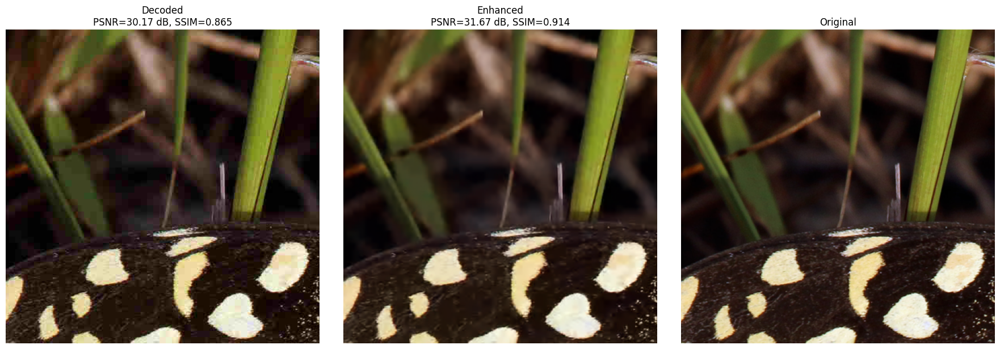

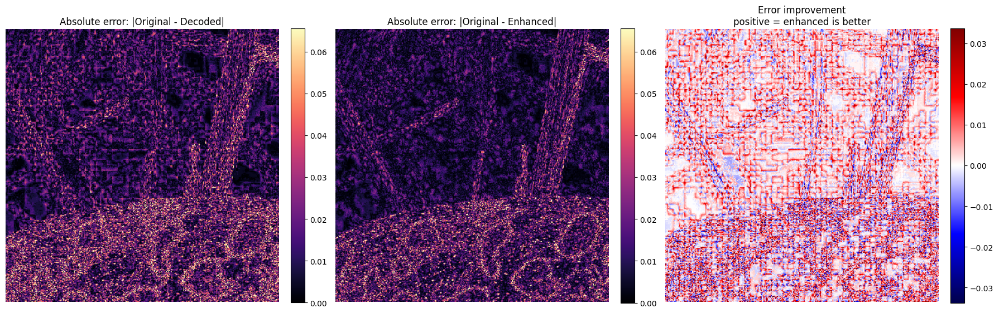

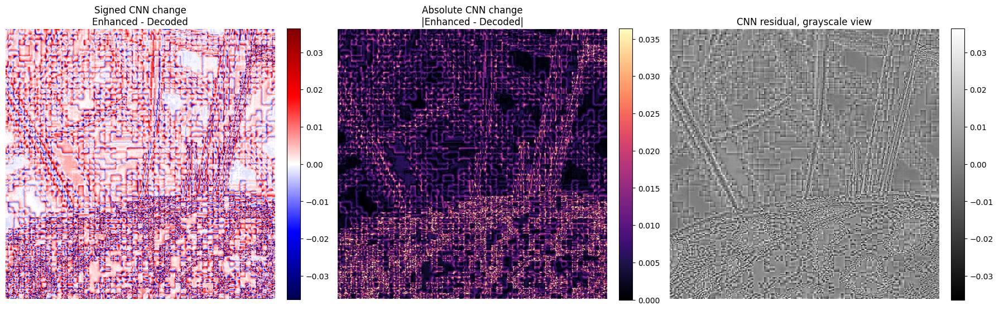

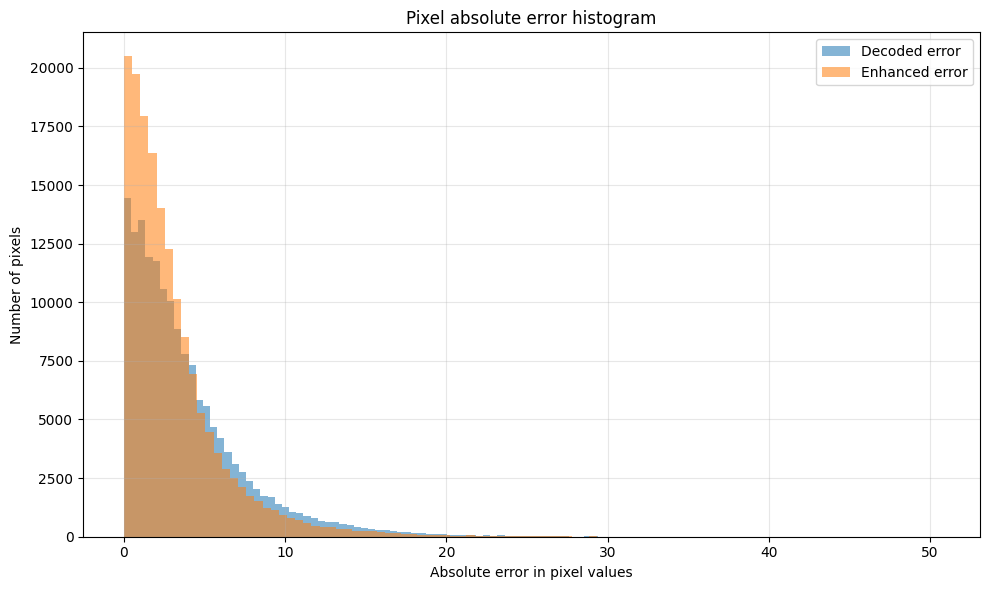

Saved report to: outputs/single_image_eval/pull_example_evaluation_report.txt
Saved figures to: outputs/single_image_eval
{'mse': 62.555370982008, 'mae': 5.7613137667694, 'psnr': 30.168157568671205, 'ssim': 0.864774227142334, 'block_boundary_jump': 10.237211227416992, 'non_boundary_gradient': 6.406681537628174, 'boundary_to_non_boundary_ratio': 1.5978960638689657}
{'mse': 44.27971073738328, 'mae': 4.531322836881647, 'psnr': 31.668755857336865, 'ssim': 0.913946807384491, 'block_boundary_jump': 6.2911200523376465, 'non_boundary_gradient': 5.747259616851807, 'boundary_to_non_boundary_ratio': 1.0946295209885537}
{'mse_reduction_percent': 29.215173621078186, 'mae_reduction_percent': 21.34913975432629, 'psnr_gain_db': 1.5005982886656604, 'ssim_gain': 0.04917258024215698, 'block_boundary_jump_reduction_percent': 38.546544401236815}


In [12]:
from pathlib import Path

import numpy as np
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms


# ============================================================
# 1. Model definitions
# Must match the model used during training
# ============================================================

class ResidualConvBlock(nn.Module):
    def __init__(
        self,
        in_ch,
        out_ch,
        kernel_size=3,
        stride=1,
        padding=1,
        dilation=1
    ):
        super().__init__()

        self.conv1 = nn.Conv2d(
            in_ch,
            out_ch,
            kernel_size=kernel_size,
            stride=stride,
            padding=padding,
            dilation=dilation,
            padding_mode="reflect"
        )

        self.conv2 = nn.Conv2d(
            out_ch,
            out_ch,
            kernel_size=kernel_size,
            stride=1,
            padding=padding,
            dilation=dilation,
            padding_mode="reflect"
        )

        self.relu = nn.LeakyReLU(0.1, inplace=True)

        if in_ch != out_ch:
            self.shortcut = nn.Conv2d(in_ch, out_ch, kernel_size=1)
        else:
            self.shortcut = nn.Identity()

    def forward(self, x):
        identity = self.shortcut(x)

        out = self.conv1(x)
        out = self.relu(out)
        out = self.conv2(out)

        out = out + identity
        out = self.relu(out)

        return out


class UpBlock(nn.Module):
    def __init__(self, in_ch, out_ch, kernel_size=3, padding=1, skip_scale=0.7):
        super().__init__()

        self.skip_scale = skip_scale

        self.up = nn.ConvTranspose2d(
            in_ch,
            out_ch,
            kernel_size=2,
            stride=2
        )

        self.conv = ResidualConvBlock(
            in_ch=out_ch * 2,
            out_ch=out_ch,
            kernel_size=kernel_size,
            padding=padding
        )

    def forward(self, x1, x2):
        x1 = self.up(x1)

        diff_y = x2.size(2) - x1.size(2)
        diff_x = x2.size(3) - x1.size(3)

        x1 = F.pad(
            x1,
            [
                diff_x // 2,
                diff_x - diff_x // 2,
                diff_y // 2,
                diff_y - diff_y // 2
            ]
        )

        x = torch.cat([self.skip_scale * x2, x1], dim=1)
        return self.conv(x)


class ResUNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, base_features=32):
        super().__init__()

        f = base_features

        self.inc = ResidualConvBlock(
            in_channels,
            f,
            kernel_size=5,
            padding=2
        )

        self.down1 = nn.Sequential(
            nn.AvgPool2d(kernel_size=2, stride=2),
            ResidualConvBlock(f, f * 2)
        )

        self.down2 = nn.Sequential(
            nn.AvgPool2d(kernel_size=2, stride=2),
            ResidualConvBlock(f * 2, f * 4)
        )

        self.down3 = nn.Sequential(
            nn.AvgPool2d(kernel_size=2, stride=2),
            ResidualConvBlock(f * 4, f * 8)
        )

        self.up1 = UpBlock(f * 8, f * 4, skip_scale=0.7)
        self.up2 = UpBlock(f * 4, f * 2, skip_scale=0.7)
        self.up3 = UpBlock(f * 2, f, skip_scale=0.7)

        self.outc = nn.Conv2d(
            f,
            out_channels,
            kernel_size=3,
            padding=1,
            padding_mode="reflect"
        )

        self.res_scale = nn.Parameter(torch.tensor(0.2))

    def forward(self, x):
        decoded_input = x

        pad = 16
        x = F.pad(x, (pad, pad, pad, pad), mode="reflect")

        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)

        x = self.up1(x4, x3)
        x = self.up2(x, x2)
        x = self.up3(x, x1)

        residual = self.outc(x)
        residual = residual[..., pad:-pad, pad:-pad]

        enhanced = decoded_input + self.res_scale * residual

        if self.training:
            return enhanced

        return torch.clamp(enhanced, 0.0, 1.0)


# ============================================================
# 2. Utility functions
# ============================================================

def load_model(checkpoint_path, device):
    checkpoint = torch.load(checkpoint_path, map_location=device)

    grayscale = checkpoint.get("grayscale", False)
    base_features = checkpoint.get("base_features", 32)

    in_channels = 1 if grayscale else 3
    out_channels = in_channels

    model = ResUNet(
        in_channels=in_channels,
        out_channels=out_channels,
        base_features=base_features
    ).to(device)

    model.load_state_dict(checkpoint["model_state_dict"])
    model.eval()

    print(f"Loaded checkpoint from epoch {checkpoint.get('epoch', 'unknown')}")
    print(f"Validation loss: {checkpoint.get('val_loss', 'unknown')}")
    print(f"Base features: {base_features}")
    print(f"Grayscale: {grayscale}")

    return model, grayscale


def tensor_to_pil(tensor):
    """
    tensor: [1, C, H, W] in [0, 1]
    """
    tensor = tensor.squeeze(0).detach().cpu().clamp(0.0, 1.0)

    array = tensor.numpy()

    if array.shape[0] == 1:
        array = array[0]
        array = array * 255.0
        return Image.fromarray(array.astype(np.uint8), mode="L")

    array = np.transpose(array, (1, 2, 0))
    array = array * 255.0

    return Image.fromarray(array.astype(np.uint8), mode="RGB")


# ============================================================
# 3. Full-image inference
# ============================================================

@torch.no_grad()
def enhance_full_image(model, image_tensor, device):
    """
    Use this if the full image fits in GPU memory.

    image_tensor: [1, C, H, W]
    """
    image_tensor = image_tensor.to(device)
    enhanced = model(image_tensor)
    return enhanced


# ============================================================
# 4. Tiled inference for large images
# ============================================================

@torch.no_grad()
def enhance_image_tiled(
    model,
    image_tensor,
    device,
    tile_size=512,
    overlap=64
):
    """
    Tiled inference with averaging in overlapping areas.

    image_tensor: [1, C, H, W]

    tile_size should be divisible by 8 or 16.
    overlap helps avoid seams between tiles.
    """

    model.eval()

    image_tensor = image_tensor.to(device)

    _, C, H, W = image_tensor.shape

    output = torch.zeros_like(image_tensor, device=device)
    weight = torch.zeros_like(image_tensor, device=device)

    stride = tile_size - overlap

    y_positions = list(range(0, H, stride))
    x_positions = list(range(0, W, stride))

    for y in y_positions:
        for x in x_positions:
            y0 = y
            x0 = x
            y1 = min(y0 + tile_size, H)
            x1 = min(x0 + tile_size, W)

            # Move tile window back if we are near the border
            y0 = max(0, y1 - tile_size)
            x0 = max(0, x1 - tile_size)

            tile = image_tensor[:, :, y0:y1, x0:x1]

            enhanced_tile = model(tile)

            output[:, :, y0:y1, x0:x1] += enhanced_tile
            weight[:, :, y0:y1, x0:x1] += 1.0

    output = output / weight.clamp_min(1e-8)
    output = torch.clamp(output, 0.0, 1.0)

    return output


# ============================================================
# 5. Main
# ============================================================

def main():
    checkpoint_path = "models/best_resunet_jpeg_artifact_removal_2.pth"

    img = loaded_data_rgb[44]

    codec = JPEGCodec3(
        block_size=8,
        color_space="YCbCr",
        q_y=40,
        q_c=40*1.6,
    )

    encoded = codec.encode_symbols(img)
    decoded = codec.decode_symbols(encoded)

    use_tiling = True

    tile_size = 512
    overlap = 64

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    model, grayscale = load_model(checkpoint_path, device)

    image = decoded

    if grayscale:
        image = image.convert("L")
    else:
        image = image.convert("RGB")

    to_tensor = transforms.ToTensor()

    image_tensor = to_tensor(image).unsqueeze(0)

    print(f"Input tensor shape: {image_tensor.shape}")

    if use_tiling:
        enhanced_tensor = enhance_image_tiled(
            model=model,
            image_tensor=image_tensor,
            device=device,
            tile_size=tile_size,
            overlap=overlap
        )
    else:
        enhanced_tensor = enhance_full_image(
            model=model,
            image_tensor=image_tensor,
            device=device
        )

    enhanced_image = tensor_to_pil(enhanced_tensor)
    #plot decoded and enhanced image
    # plt.figure(figsize=(16, 8))
    # plt.subplot(1, 2, 1)
    # plt.imshow(image)
    # plt.title("Decoded image")
    # plt.axis("off")
    # plt.subplot(1, 2, 2)
    # plt.imshow(enhanced_image)
    # plt.title("Enhanced image")
    # plt.axis("off")
    # plt.show()
    results = evaluate_image_triplet(
    original=img,
    decoded=decoded,
    enhanced=enhanced_image,
    output_dir="outputs/single_image_eval",
    name="pull_example",
    zoom=(300, 200, 700, 600),
    block_size=8,
    show_grid=False,
    save_figures=True,
    show_figures=True
)
    print(results["decoded"])
    print(results["enhanced"])
    print(results["improvement"])


if __name__ == "__main__":
    main()
    ## Entropy estimat

# **DCT matrix**

In [5]:
def construct_dct_matrix(N: int = 8) -> np.ndarray:
    """
    Construct the DCT (Discrete Cosine Transform) matrix of size NxN.
    """
    C = np.zeros((N, N), dtype=np.float64)

    for i in range(N):
        for j in range(N):
            if i == 0:
                alpha = np.sqrt(1 / N)
            else:
                alpha = np.sqrt(2 / N)

            C[i, j] = alpha * np.cos(((2 * j + 1) * i * np.pi) / (2 * N))
    return C

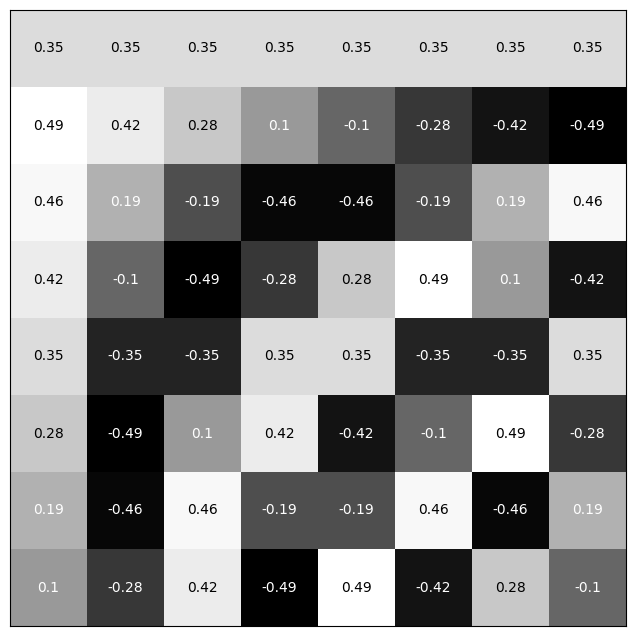

In [6]:
size = 8
DCT = construct_dct_matrix(size)

plt.figure(figsize=(size, size))
plt.imshow(DCT, cmap='gray')
for i in range(DCT.shape[0]):
    for j in range(DCT.shape[1]):
        color = "white" if DCT[i, j] < DCT.max() / 2 else "black"
        plt.text(j, i, str(round(DCT[i, j], 2)),
                ha="center", va="center", color=color)

# plt.title('DCT Matrix (8x8)')
plt.xticks([])
plt.yticks([])
plt.show()

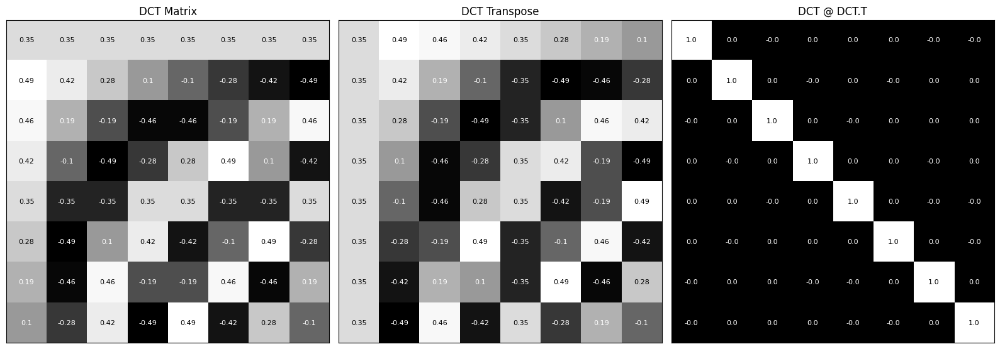

In [7]:
size = 8
DCT = construct_dct_matrix(size)
fig, axes = plt.subplots(1, 3, figsize=(size*2, size*2))

for ax, img, title in zip(axes, [DCT, DCT.T, DCT@DCT.T], ["DCT Matrix", "DCT Transpose", "DCT @ DCT.T"]):
    ax.imshow(img, cmap="gray")

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            color = "white" if img[i, j] < img.max() / 2 else "black"
            ax.text(j, i, round(img[i, j], 2), ha="center", va="center", color=color, fontsize=8)

    ax.set_title(title)
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()